In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv(r"C:\Users\tanay\OneDrive\Documents\Work\Epoch\K-Means (Task 1)\clustering_data.csv")
df.head()

In [ ]:
df['StateName'].value_counts()

Filtering the pincodes of India with respect to the state of Maharshtra

In [ ]:
for i in range (df.shape[0]):
    if df['StateName'][i] != 'MAHARASHTRA':
        df = df.drop([i])

In [ ]:
df.head()

In [ ]:
df.to_csv("C:\Users\tanay\OneDrive\Documents\Work\Epoch\K-Means (Task 1)\clustering_data_mah.csv", sep=',', encoding='utf-8')

The above mentioned process is intensive so in order to only have to run it once, the output of the filtration is saved in a csv file of its own so that the new csv file can be called for later iterations below: 

In [13]:
dfm = pd.read_csv(r"C:\Users\tanay\OneDrive\Documents\Work\Epoch\K-Means (Task 1)\clustering_data_mah.csv")
print(dfm.shape)
dfm.head()

(12756, 12)


,Unnamed: 0,CircleName,RegionName,DivisionName,OfficeName,Pincode,OfficeType,Delivery,District,StateName,Latitude,Longitude
0,934,Maharashtra Circle,Nagpur Region,Amaravati Division,Bhatkuli S.O,444602,PO,Non Delivery,AMRAVATI,MAHARASHTRA,20.907000,77.6026
1,37630,Maharashtra Circle,Nagpur Region,Chandrapur Division,Subai B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.573344,79.4422593
2,37631,Maharashtra Circle,Nagpur Region,Chandrapur Division,Tembhuwahi B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.692433,79.3571161
3,37632,Maharashtra Circle,Nagpur Region,Chandrapur Division,Vihirgaon B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.726809,79.453512
4,38709,Maharashtra Circle,Aurangabad Region,Osmanabad Division,Nilegaon B.O,413603,BO,Delivery,OSMANABAD,MAHARASHTRA,18.010041,76.0710641


In [14]:
dfm = dfm.dropna()
dfm.isnull().sum()

Unnamed: 0      0
CircleName      0
RegionName      0
DivisionName    0
OfficeName      0
Pincode         0
OfficeType      0
Delivery        0
District        0
StateName       0
Latitude        0
Longitude       0
dtype: int64

In [15]:
print(dfm.shape)
dfm.head()

(11983, 12)


,Unnamed: 0,CircleName,RegionName,DivisionName,OfficeName,Pincode,OfficeType,Delivery,District,StateName,Latitude,Longitude
0,934,Maharashtra Circle,Nagpur Region,Amaravati Division,Bhatkuli S.O,444602,PO,Non Delivery,AMRAVATI,MAHARASHTRA,20.907000,77.6026
1,37630,Maharashtra Circle,Nagpur Region,Chandrapur Division,Subai B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.573344,79.4422593
2,37631,Maharashtra Circle,Nagpur Region,Chandrapur Division,Tembhuwahi B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.692433,79.3571161
3,37632,Maharashtra Circle,Nagpur Region,Chandrapur Division,Vihirgaon B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.726809,79.453512
4,38709,Maharashtra Circle,Aurangabad Region,Osmanabad Division,Nilegaon B.O,413603,BO,Delivery,OSMANABAD,MAHARASHTRA,18.010041,76.0710641


In [16]:
dfm = dfm.drop_duplicates()
print(dfm.shape)
dfm.head()

(11983, 12)


,Unnamed: 0,CircleName,RegionName,DivisionName,OfficeName,Pincode,OfficeType,Delivery,District,StateName,Latitude,Longitude
0,934,Maharashtra Circle,Nagpur Region,Amaravati Division,Bhatkuli S.O,444602,PO,Non Delivery,AMRAVATI,MAHARASHTRA,20.907000,77.6026
1,37630,Maharashtra Circle,Nagpur Region,Chandrapur Division,Subai B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.573344,79.4422593
2,37631,Maharashtra Circle,Nagpur Region,Chandrapur Division,Tembhuwahi B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.692433,79.3571161
3,37632,Maharashtra Circle,Nagpur Region,Chandrapur Division,Vihirgaon B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.726809,79.453512
4,38709,Maharashtra Circle,Aurangabad Region,Osmanabad Division,Nilegaon B.O,413603,BO,Delivery,OSMANABAD,MAHARASHTRA,18.010041,76.0710641


In [17]:
dfm["StateName"].value_counts()
dfm = dfm.drop('Unnamed: 0', axis=1)
dfm.head()

,CircleName,RegionName,DivisionName,OfficeName,Pincode,OfficeType,Delivery,District,StateName,Latitude,Longitude
0,Maharashtra Circle,Nagpur Region,Amaravati Division,Bhatkuli S.O,444602,PO,Non Delivery,AMRAVATI,MAHARASHTRA,20.907000,77.6026
1,Maharashtra Circle,Nagpur Region,Chandrapur Division,Subai B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.573344,79.4422593
2,Maharashtra Circle,Nagpur Region,Chandrapur Division,Tembhuwahi B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.692433,79.3571161
3,Maharashtra Circle,Nagpur Region,Chandrapur Division,Vihirgaon B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.726809,79.453512
4,Maharashtra Circle,Aurangabad Region,Osmanabad Division,Nilegaon B.O,413603,BO,Delivery,OSMANABAD,MAHARASHTRA,18.010041,76.0710641


In [18]:
x_axis = np.array(dfm["Longitude"])
y_axis = np.array(dfm["Latitude"])

In [19]:
for i in dfm.index:
    dfm["Longitude"][i] = dfm["Longitude"][i][:9]
    dfm["Longitude"][i] = float(dfm["Longitude"][i])
    dfm["Latitude"][i] = float(dfm["Latitude"][i])

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longi

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Latitude"][i] = float(dfm["Latitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lo

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = dfm["Longitude"][i][:9]
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Longitude"][i] = float(dfm["Longitude"][i])
C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\853313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfm["Lat

Filtering The given data against the known Latitudinal and Longitudinal bounds of the State

Bounds
15.58333333, 72.60000000
22.03333333, 80.90000000

In [20]:
for i in dfm.index:
    if (dfm["Latitude"][i] < 15.58333333) or (dfm["Latitude"][i] > 22.03333333):
        dfm = dfm.drop(i, axis = 0)
for i in dfm.index:
    if (dfm["Longitude"][i] < 72.60000000) or (dfm["Longitude"][i] > 80.90000000):
        dfm = dfm.drop(i, axis = 0)

In [21]:
X = dfm["Longitude"]
Y = dfm["Latitude"]

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\2158692796.py:1: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X, Y, c=(0.8, 0.35, 0.1), s = 10)


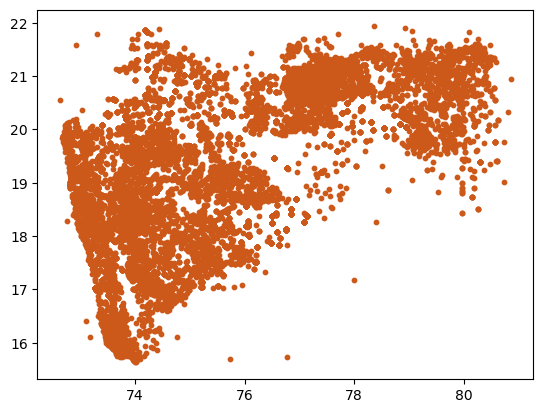

In [22]:
plt.scatter(X, Y, c=(0.8, 0.35, 0.1), s = 10)
plt.show()

Insights:

1. We can clearly see geographical features such as:

    1.1. The Wester Ghats (Straight vertical line on the left)
    
    1.2. The northern part of the Central Deccan Plateau (Clearing in the southeast region)
    
    Due to the sparsity of pincodes in that given area.
    
2. 

In [23]:
dfm.head()

,CircleName,RegionName,DivisionName,OfficeName,Pincode,OfficeType,Delivery,District,StateName,Latitude,Longitude
0,Maharashtra Circle,Nagpur Region,Amaravati Division,Bhatkuli S.O,444602,PO,Non Delivery,AMRAVATI,MAHARASHTRA,20.907000,77.6026
1,Maharashtra Circle,Nagpur Region,Chandrapur Division,Subai B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.573344,79.442259
2,Maharashtra Circle,Nagpur Region,Chandrapur Division,Tembhuwahi B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.692433,79.357116
3,Maharashtra Circle,Nagpur Region,Chandrapur Division,Vihirgaon B.O,442905,BO,Delivery,CHANDRAPUR,MAHARASHTRA,19.726809,79.453512
4,Maharashtra Circle,Aurangabad Region,Osmanabad Division,Nilegaon B.O,413603,BO,Delivery,OSMANABAD,MAHARASHTRA,18.010041,76.071064


K-Means (Reference: https://www.youtube.com/watch?v=lX-3nGHDhQg)

for K = 36 (No. of Districts in Maharshtra)

In [24]:
features = ['Latitude', 'Longitude']
data = pd.DataFrame((dfm["Longitude"], dfm["Latitude"]))
data = pd.DataFrame.transpose(data)
print(data.shape)
data.head()

(11546, 2)


,Longitude,Latitude
0,77.602600,20.907000
1,79.442259,19.573344
2,79.357116,19.692433
3,79.453512,19.726809
4,76.071064,18.010041


In [25]:
def random_centroids(data, k):
    centroids = []
    for i in range(k):
        centroid = data.apply(lambda x: float(x.sample()))
        centroids.append(centroid)
    return pd.concat(centroids, axis=1)

In [26]:
centroids = random_centroids(data, 36)
centroids

C:\Users\tanay\AppData\Local\Temp\ipykernel_14948\1845334667.py:4: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  centroid = data.apply(lambda x: float(x.sample()))


,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
Longitude,78.717750,74.141613,74.64000,79.688096,74.312715,73.980432,77.1200,74.453055,77.4,73.987500,...,74.601833,74.109817,74.20775,73.837388,75.768989,74.04560,74.112416,72.837000,74.379258,73.830779
Latitude,18.825894,20.901640,19.35697,21.246579,19.864134,17.935000,17.6529,20.348992,19.2,17.984462,...,16.436260,20.090050,18.10548,17.499962,20.083063,18.10683,19.200000,17.533307,18.259060,19.240000


In [27]:
def get_labels(data, centroids):
    distances = centroids.apply(lambda x: np.sqrt(((data - x) ** 2).sum(axis = 1)))
    return distances.idxmin(axis = 1)

In [28]:
labels = get_labels(data, centroids)

In [29]:
labels = pd.DataFrame(labels).T
labels

,0,1,2,3,4,5,6,7,8,9,...,12746,12747,12748,12749,12750,12751,12752,12753,12754,12755
0,25,25,25,25,13,13,13,13,13,13,...,25,25,3,3,25,25,25,3,3,11


In [30]:
def new_centroids(data, labels, k):
    return data.groupby(labels).apply(lambda x: np.exp(np.log(x).mean())).T

In [31]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

In [32]:
def plot_clusters(data, labels, centroids, iteration):
    clear_output(wait=True)
    plt.title(f'Iteration {iteration}')
    plt.scatter(x=data[:, 0], y=data[:, 1], c = labels, s = 10)

    plt.show()

k = The number of districts in Maharshtra

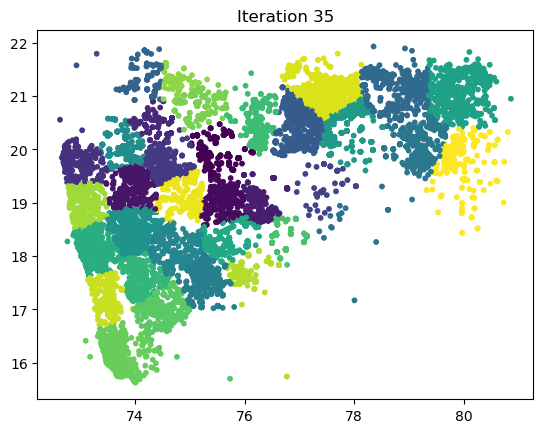

In [33]:
max_iterations = 100
k = 36

centroids = random_centroids(data, k)
old_centroids = pd.DataFrame()
iteration = 1

while (iteration < max_iterations and not centroids.equals(old_centroids)):
    old_centroids = centroids

    labels = get_labels(data, centroids)
    labels = np.array(labels)
    centroids = new_centroids(data, labels, k)
    plot_clusters(data.to_numpy(), labels, centroids.to_numpy(), iteration)

    iteration += 1

Insights:

1. The model doesn't seem to accurately predict the distric of Mumbai, possible reasons are: since districs are assigned on population whereas pincodes are assigned roughly on distance, there is a large amount of population in the Mumbai area having a relatively small number of pincodes, thus the distric is predicted bigger than the actual size.

2. 